In [148]:
import pandas as pd
import numpy as np
import plotly.express as px
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\SJoshi\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [109]:
df_attacks = pd.read_csv("../data/globalterrorismdb_0718dist.csv", encoding="ISO-8859-1", low_memory=False)
df_attacks = df_attacks[['eventid','iyear', 'imonth', 'iday', 'country_txt', 'region_txt', 
'provstate', 'city', 'latitude', 'longitude', 'suicide', 'attacktype1_txt', 'targtype1_txt', 
'gname', 'motive', 'weaptype1_txt', 'nkill']]
df_attacks.rename(columns={"eventid": "Event ID", "iyear": "Year", "imonth": "Month", 
"country_txt": "Country", "region_txt": "Region", "provstate": "Province/State", "city": "City", "latitude": "Latitude", 
"longitude": "Longitude", "suicide": "Suicide", "attacktype1_txt": "Attack Type",
"targtype1_txt": "Target Type", "gname": "Terrorist Group", "motive": "Motive", 
"weaptype1_txt": "Weapon Type", "nkill": "Casualties"}, inplace=True)

df_population = pd.read_csv("../data/population.csv")
df_population = df_population[["Country","Year", "Migrants(net)", "FertilityRate"]]
df_population.rename(columns= {"FertilityRate": "Fertility Rate", "Migrants(net)": "Migrants (net)"}, inplace=True)

df_gdp = pd.read_csv("../data/world_country_gdp_usd.csv")
df_gdp = df_gdp[['Country Name','year', 'GDP_USD']]
df_gdp.rename(columns= {"Country Name": "Country", "year": "Year", "GDP_USD":"GDP (in USD)"}, inplace=True)

In [110]:
df_attacks.head()

,Event ID,Year,Month,iday,Country,Region,Province/State,City,Latitude,Longitude,Suicide,Attack Type,Target Type,Terrorist Group,Motive,Weapon Type,Casualties
0,197000000001,1970,7,2,Dominican Republic,Central America & Caribbean,NaN,Santo Domingo,18.456792,-69.951164,0,Assassination,Private Citizens & Property,MANO-D,NaN,Unknown,1.0
1,197000000002,1970,0,0,Mexico,North America,Federal,Mexico city,19.371887,-99.086624,0,Hostage Taking (Kidnapping),Government (Diplomatic),23rd of September Communist League,NaN,Unknown,0.0
2,197001000001,1970,1,0,Philippines,Southeast Asia,Tarlac,Unknown,15.478598,120.599741,0,Assassination,Journalists & Media,Unknown,NaN,Unknown,1.0
3,197001000002,1970,1,0,Greece,Western Europe,Attica,Athens,37.997490,23.762728,0,Bombing/Explosion,Government (Diplomatic),Unknown,NaN,Explosives,NaN
4,197001000003,1970,1,0,Japan,East Asia,Fukouka,Fukouka,33.580412,130.396361,0,Facility/Infrastructure Attack,Government (Diplomatic),Unknown,NaN,Incendiary,NaN


In [111]:
df_attacks.isnull().sum()

Event ID                0
Year                    0
Month                   0
iday                    0
Country                 0
Region                  0
Province/State        421
City                  434
Latitude             4556
Longitude            4557
Suicide                 0
Attack Type             0
Target Type             0
Terrorist Group         0
Motive             131130
Weapon Type             0
Casualties          10313
dtype: int64

In [112]:
df_population.head()

,Country,Year,Migrants (net),Fertility Rate
0,Afghanistan,1955,-4000,7.45
1,Afghanistan,1960,-4000,7.45
2,Afghanistan,1965,-4000,7.45
3,Afghanistan,1970,-4000,7.45
4,Afghanistan,1975,-4000,7.45


In [113]:
df_population.isnull().sum()

Country           0
Year              0
Migrants (net)    0
Fertility Rate    0
dtype: int64

In [114]:
df_gdp.head()

,Country,Year,GDP (in USD)
0,Aruba,1960,NaN
1,Africa Eastern and Southern,1960,2.129059e+10
2,Afghanistan,1960,5.377778e+08
3,Africa Western and Central,1960,1.040414e+10
4,Angola,1960,NaN


In [115]:
len(df_gdp)

16492

In [116]:
df_gdp.isnull().sum()

Country            0
Year               0
GDP (in USD)    3374
dtype: int64

In [117]:
fig = px.scatter_geo(df_attacks, lon="Longitude", lat="Latitude", animation_frame="Year", color="Region",
                     projection="equirectangular", animation_group="Year")
fig.show()

In [118]:
us_states = np.asarray(['AL', 'AK', 'AZ', 'AR', 'CA', 'CO', 'CT', 'DE', 'DC', 'FL', 'GA',
                        'HI', 'ID', 'IL', 'IN', 'IA', 'KS', 'KY', 'LA', 'ME', 'MD', 'MA',
                        'MI', 'MN', 'MS', 'MO', 'MT', 'NE', 'NV', 'NH', 'NJ', 'NM', 'NY',
                        'NC', 'ND', 'OH', 'OK', 'OR', 'PA', 'RI', 'SC', 'SD', 'TN', 'TX',
                        'UT', 'VT', 'VA', 'WA', 'WV', 'WI', 'WY'])
us_state_to_abbrev = {
    "Alabama": "AL",
    "Alaska": "AK",
    "Arizona": "AZ",
    "Arkansas": "AR",
    "California": "CA",
    "Colorado": "CO",
    "Connecticut": "CT",
    "Delaware": "DE",
    "Florida": "FL",
    "Georgia": "GA",
    "Hawaii": "HI",
    "Idaho": "ID",
    "Illinois": "IL",
    "Indiana": "IN",
    "Iowa": "IA",
    "Kansas": "KS",
    "Kentucky": "KY",
    "Louisiana": "LA",
    "Maine": "ME",
    "Maryland": "MD",
    "Massachusetts": "MA",
    "Michigan": "MI",
    "Minnesota": "MN",
    "Mississippi": "MS",
    "Missouri": "MO",
    "Montana": "MT",
    "Nebraska": "NE",
    "Nevada": "NV",
    "New Hampshire": "NH",
    "New Jersey": "NJ",
    "New Mexico": "NM",
    "New York": "NY",
    "North Carolina": "NC",
    "North Dakota": "ND",
    "Ohio": "OH",
    "Oklahoma": "OK",
    "Oregon": "OR",
    "Pennsylvania": "PA",
    "Rhode Island": "RI",
    "South Carolina": "SC",
    "South Dakota": "SD",
    "Tennessee": "TN",
    "Texas": "TX",
    "Utah": "UT",
    "Vermont": "VT",
    "Virginia": "VA",
    "Washington": "WA",
    "West Virginia": "WV",
    "Wisconsin": "WI",
    "Wyoming": "WY",
    "District of Columbia": "DC",
    "American Samoa": "AS",
    "Guam": "GU",
    "Northern Mariana Islands": "MP",
    "Puerto Rico": "PR",
    "United States Minor Outlying Islands": "UM",
    "U.S. Virgin Islands": "VI",
}

In [119]:
df_attacks_us = df_attacks[df_attacks["Country"] == "United States"] 
df_attacks_us = pd.DataFrame(df_attacks_us.groupby("Province/State")["Event ID"].count())
df_attacks_us = df_attacks_us.reset_index()
df_attacks_us.rename(columns={"Province/State": "State", "Event ID": "Number of Terrorist Attacks"}, inplace=True)
df_attacks_us = df_attacks_us[df_attacks_us["State"] != "Unknown"]
df_attacks_us["State Code"] = df_attacks_us["State"].apply(lambda x: us_state_to_abbrev[x])
df_attacks_us

,State,Number of Terrorist Attacks,State Code
0,Alabama,16,AL
1,Alaska,1,AK
2,Arizona,34,AZ
3,Arkansas,5,AR
4,California,595,CA
5,Colorado,45,CO
6,Connecticut,17,CT
7,Delaware,3,DE
8,District of Columbia,83,DC
9,Florida,158,FL


In [120]:
fig = px.choropleth(df_attacks_us, locations='State Code', color='Number of Terrorist Attacks',
                    color_continuous_scale="Viridis",
                    locationmode="USA-states", 
                    scope="usa",
                    labels={'Number of Terrorist Attacks':'Number of Terrorist Attacks'},
                    title="Terrorist Attacks in US (1970-2017)")
fig.show()

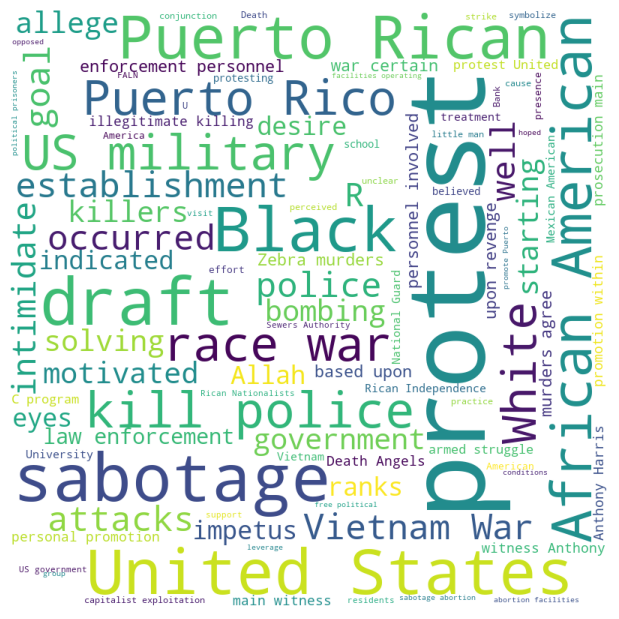

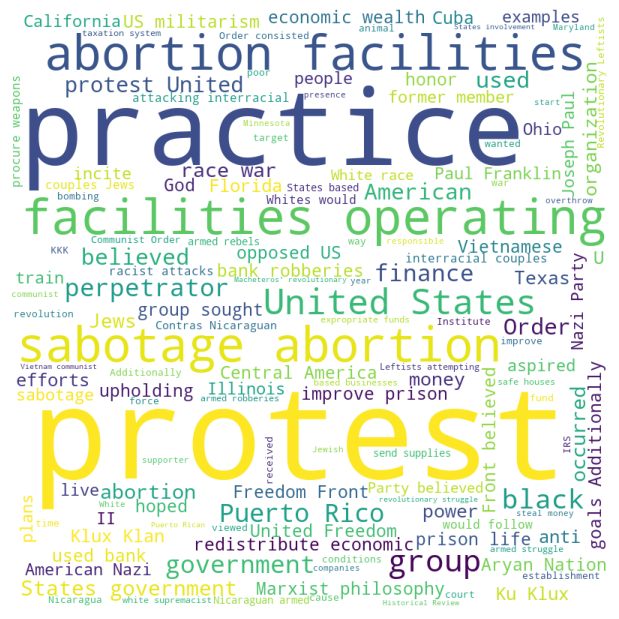

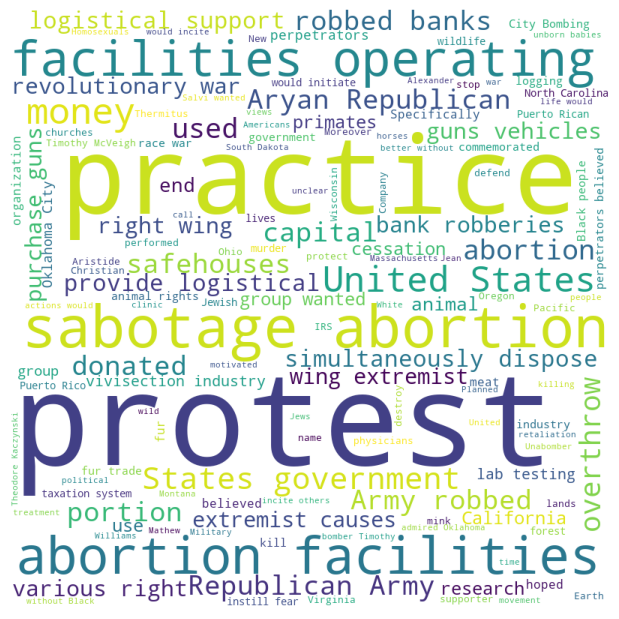

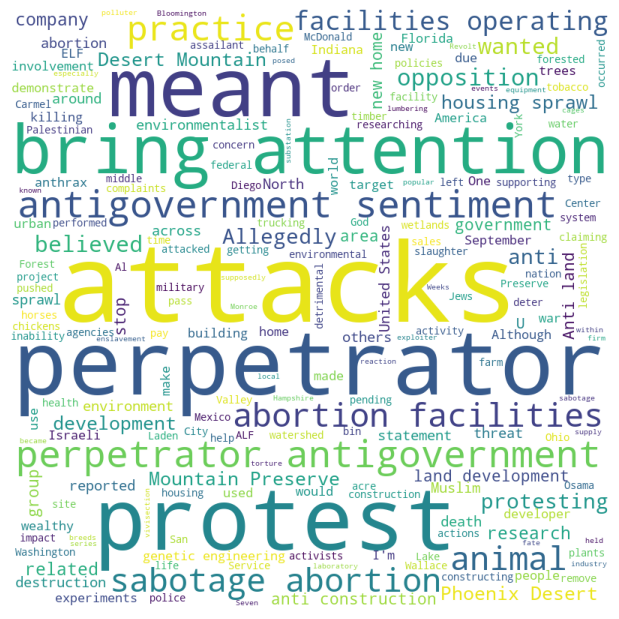

In [121]:
stpwrd = nltk.corpus.stopwords.words('english')
stpwrd.extend(["specific",  "motive", "unknown", "Unknown", "incident", "claimed", "responsibility", "however", "unaffiliated", 
                "individual", "identified", "killed", "stated", "attack", "trend", "larger", "may", "part", "following", "community", "sources",
                "violence", "targeting", "noted", "posited", "suspected", "targeting", "members", "noted", "targeted", "also"])

df_attacks_us = df_attacks[df_attacks["Country"] == "United States"]
df_attacks_us = df_attacks_us[["Year", "Motive"]]
df_attacks_us = df_attacks_us.dropna()

for year in range(1970, 2010, 10):
    temp_df = df_attacks_us[(df_attacks_us["Year"] >= year) & (df_attacks_us["Year"] < (year + 10))]
    motive = list(temp_df["Motive"].values)
    motive = " ".join(motive)
    from wordcloud import WordCloud
    import matplotlib.pyplot as plt

    wordcloud = WordCloud(width=800, height=800, 
                    background_color ='white', 
                    stopwords=stpwrd,
                    min_font_size = 10).generate(motive)
    plt.figure(figsize = (6, 6), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    
    plt.show() 

In [122]:
yearly_freq = pd.DataFrame(df_attacks.groupby("Year")["Event ID"].count()).reset_index()
yearly_freq.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)
fig = px.bar(yearly_freq, x=yearly_freq["Year"], y=yearly_freq["Number of Terrorist Attacks"], height=400)
fig.show()

In [123]:
region_freq = pd.DataFrame(df_attacks.groupby("Region")["Event ID"].count()).reset_index()
region_freq.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)
region_freq = region_freq.sort_values(by="Number of Terrorist Attacks", ascending=False)
fig = px.bar(region_freq, x=region_freq["Region"], y=region_freq["Number of Terrorist Attacks"], height=400)
fig.show()

In [124]:
region_freq = pd.DataFrame(df_attacks.groupby(["Region", "Attack Type"])["Event ID"].count()).reset_index()
region_freq.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)
region_freq = region_freq.sort_values(by="Number of Terrorist Attacks", ascending=False)
fig = px.bar(region_freq, x=region_freq["Region"], y=region_freq["Number of Terrorist Attacks"], color="Attack Type", height=400)
fig.show()

In [125]:
country_freq = pd.DataFrame(df_attacks.groupby("Country")["Event ID"].count()).reset_index()
country_freq.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)
country_freq = country_freq.sort_values(by="Number of Terrorist Attacks", ascending=False)[:10]
fig = px.bar(country_freq, x=country_freq["Country"], y=country_freq["Number of Terrorist Attacks"], height=400)
fig.show()

In [126]:
casualty_freq = pd.DataFrame(df_attacks.groupby("Country")["Casualties"].sum()).reset_index()
casualty_freq = casualty_freq.sort_values(by="Casualties", ascending=False)[:10]
fig = px.bar(casualty_freq, x=casualty_freq["Country"], y=casualty_freq["Casualties"], height=400)
fig.show()

In [127]:
TOP_N = 5
target_freq = pd.DataFrame(df_attacks.groupby("Target Type")["Event ID"].count()).reset_index()
target_freq.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)
rem_freq = target_freq.sort_values(by="Number of Terrorist Attacks", ascending=False)[TOP_N:]
target_freq = target_freq.sort_values(by="Number of Terrorist Attacks", ascending=False)[:TOP_N]
others_row = {"Target Type": "Others", "Number of Terrorist Attacks": rem_freq["Number of Terrorist Attacks"].sum()}
target_freq = target_freq.append(others_row, ignore_index=True)
fig = px.pie(target_freq, values='Number of Terrorist Attacks', hole=.4, names='Target Type', height=400)
fig.show()

C:\Users\SJoshi\AppData\Local\Temp\ipykernel_16368\2391410573.py:7: FutureWarning:

The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.



In [128]:
groupwise_casualty_freq = pd.DataFrame(df_attacks.groupby("Terrorist Group")["Casualties"].sum()).reset_index()
groupwise_casualty_freq = groupwise_casualty_freq.sort_values(by="Casualties", ascending=False)[:16]
fig = px.bar(groupwise_casualty_freq, x=groupwise_casualty_freq["Terrorist Group"], y=groupwise_casualty_freq["Casualties"], height=400)
fig.show()

In [129]:
notorious_groups = list(groupwise_casualty_freq["Terrorist Group"])
df_notorious_groups = df_attacks[df_attacks["Terrorist Group"].isin(notorious_groups)]
df_notorious_groups = pd.DataFrame(df_notorious_groups.groupby(["Terrorist Group", "Year"])["Casualties"].sum().reset_index())
fig = px.line(df_notorious_groups, x="Year", y="Casualties", color="Terrorist Group", title='Life expectancy in Canada')
fig.show()

In [130]:
df_countries_casualties = pd.DataFrame(df_attacks.groupby(["Country"])["Casualties"].sum().reset_index())
df_countries_terrorist_count = pd.DataFrame(df_attacks.groupby(["Country"])["Event ID"].count().reset_index())
df_countries_terrorist_count.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)
df_merged_casualties_count = df_countries_casualties.merge(df_countries_terrorist_count[["Country", "Number of Terrorist Attacks"]])

In [131]:
fig = px.scatter(df_merged_casualties_count, x="Number of Terrorist Attacks", y="Casualties", hover_data=["Country"])
fig.show()

In [132]:
df_iso_codes = px.data.gapminder()[["country", "iso_alpha"]]
df_iso_codes.rename(columns={"country": "Country", "iso_alpha": "Country Code"}, inplace=True)
df_iso_codes.drop_duplicates(inplace=True)
df_iso_codes = df_iso_codes.reset_index()
df_iso_codes.drop(["index"], axis=1, inplace=True)
df_countries_terrorist_count = df_countries_terrorist_count.merge(df_iso_codes[['Country', 'Country Code']])
fig = px.choropleth(df_countries_terrorist_count, locations="Country Code",
                    color="Number of Terrorist Attacks",
                    hover_name="Country",
                    color_continuous_scale=px.colors.sequential.Plasma)
fig.show()

In [160]:
def scale_column(df, column, minVal=float('-inf'), maxVal=float('inf')):
    if minVal == float('-inf'):
        minVal = min(df[column])
    if maxVal == float('inf'):
        maxVal = max(df[column])
    res = []
    for val in df[column]:
        res.append((val - minVal) / (maxVal - minVal))
    return res

top_five_countries = list(country_freq["Country"].values)[:5]
country_freq_year = pd.DataFrame(df_attacks.groupby(["Year", "Country"])["Event ID"].count().reset_index())
country_freq_year = country_freq_year[country_freq_year["Country"].isin(top_five_countries)]
country_freq_year.rename(columns={"Event ID": "Number of Terrorist Attacks"}, inplace=True)

In [161]:
df_gdp = df_gdp[(df_gdp["Country"].isin(top_five_countries)) & ((df_gdp["Year"] >= 1970) & (df_gdp["Year"] <= 2017))]
for country in top_five_countries:
    temp_country_freq = country_freq_year[country_freq_year["Country"] == country]
    temp_gdp = df_gdp[df_gdp["Country"] == country]
    temp_country_freq = temp_country_freq.merge(temp_gdp[['Year', 'Country', 'GDP (in USD)']])
    temp_country_freq["Number of Terrorist Attacks"] = scale_column(temp_country_freq, "Number of Terrorist Attacks", 0)
    temp_country_freq["GDP (in USD)"] = scale_column(temp_country_freq, "GDP (in USD)")
    fig = px.line(temp_country_freq, x="Year", y=["Number of Terrorist Attacks", "GDP (in USD)"])
    fig.show()

In [170]:
df_population = df_population[(df_population["Country"].isin(top_five_countries)) & ((df_population["Year"] >= 1970) & (df_population["Year"] <= 2017))]
for country in top_five_countries:
    temp_country_freq = country_freq_year[country_freq_year["Country"] == country]
    temp_population = df_population[df_population["Country"] == country]
    temp_country_freq = temp_country_freq.merge(temp_population[['Year', 'Country', 'Migrants (net)']])
    temp_country_freq["Number of Terrorist Attacks"] = scale_column(temp_country_freq, "Number of Terrorist Attacks", 0)
    temp_country_freq["Migrants (net)"] = scale_column(temp_country_freq, "Migrants (net)")
    fig = px.line(temp_country_freq, x="Year", y=["Number of Terrorist Attacks", "Migrants (net)"])
    fig.show()

In [176]:
df_population = df_population[(df_population["Country"].isin(top_five_countries)) & ((df_population["Year"] >= 1970) & (df_population["Year"] <= 2017))]
for country in top_five_countries:
    temp_country_freq = country_freq_year[country_freq_year["Country"] == country]
    temp_population = df_population[df_population["Country"] == country]
    temp_country_freq = temp_country_freq.merge(temp_population[['Year', 'Country', 'Fertility Rate']])
    temp_country_freq["Number of Terrorist Attacks"] = scale_column(temp_country_freq, "Number of Terrorist Attacks", 0)
    temp_country_freq["Fertility Rate"] = scale_column(temp_country_freq, "Fertility Rate")
    fig = px.line(temp_country_freq, x="Year", y=["Number of Terrorist Attacks", "Fertility Rate"])
    fig.show()